<h1>US Income Prediction Model </h1>
<h2>DETAILS</h2>

- Building model with UCI Adult Dataset to predict if a person is earning >50K per year.
- Comparing the preformance between XGBoost, LightGBM, AdaBoost, Random Forest, Logistic Regression & KNN.
- Evaluating the model using PCA, ROC curve & Precision-Recall curve.
- Further comparing the three best-preforming boosting model with less components and oversampled data.

<h2>DATA CLEANSING:</h2>
- Drop rows for NA data - with '?'
- String strip for empty spacing
- Identify outliner in capital gain
- One hot encoding for categorical fields
- Identify column with weak correlation

<br>
<h4>It will start with some pre-processing and data cleansing. Followed by some EDA to understand the dataset. </h4>

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier 
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from scipy import stats
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import classification_report
from lightgbm import LGBMClassifier

%matplotlib inline

In [25]:
df = pd.read_csv('data/adult.csv',header=None,na_values=' ?')

In [26]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [27]:
#re-assign column name 
df.columns = ['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','income']

In [28]:
#check number of null
df.isnull().sum()

age                  0
workclass         1836
fnlwgt               0
education            0
education-num        0
marital-status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
hours-per-week       0
native-country     583
income               0
dtype: int64

In [29]:
#strip the spacing 
df_obj = df.select_dtypes(['object'])
df[df_obj.columns] = df_obj.apply(lambda x: x.str.strip())

In [30]:
#Drop education to avoid duplicated eduction for analysis
df = df.drop(columns='education')

In [31]:
#Drop extreme capital gain rows of records
df.drop(df[df['capital-gain']>50000].index, inplace=True)

In [32]:
#drop na
df.dropna(axis=0, how='any', inplace=True)

In [33]:
#change target column to 0 and 1 for analysis
df.income.replace({'<=50K':0,'>50K':1},inplace=True)

In [11]:
#checking distribution of different fields
#85% data are from race-white
df['race'].value_counts(normalize=True)

White                 0.859599
Black                 0.093656
Asian-Pac-Islander    0.029586
Amer-Indian-Eskimo    0.009529
Other                 0.007630
Name: race, dtype: float64

In [12]:
#checking distribution of different fields
#91% data with native-country of US
df['native-country'].value_counts(normalize=True)

United-States                 0.911741
Mexico                        0.020291
Philippines                   0.006230
Germany                       0.004265
Puerto-Rico                   0.003632
Canada                        0.003532
El-Salvador                   0.003332
India                         0.003232
Cuba                          0.003065
England                       0.002865
Jamaica                       0.002665
South                         0.002366
Italy                         0.002266
China                         0.002266
Dominican-Republic            0.002199
Vietnam                       0.002132
Guatemala                     0.002099
Japan                         0.001932
Columbia                      0.001866
Poland                        0.001866
Iran                          0.001399
Haiti                         0.001399
Taiwan                        0.001366
Portugal                      0.001133
Nicaragua                     0.001099
Peru                     

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'State-gov'),
  Text(1, 0, 'Self-emp-not-inc'),
  Text(2, 0, 'Private'),
  Text(3, 0, 'Federal-gov'),
  Text(4, 0, 'Local-gov'),
  Text(5, 0, 'Self-emp-inc'),
  Text(6, 0, 'Without-pay')])

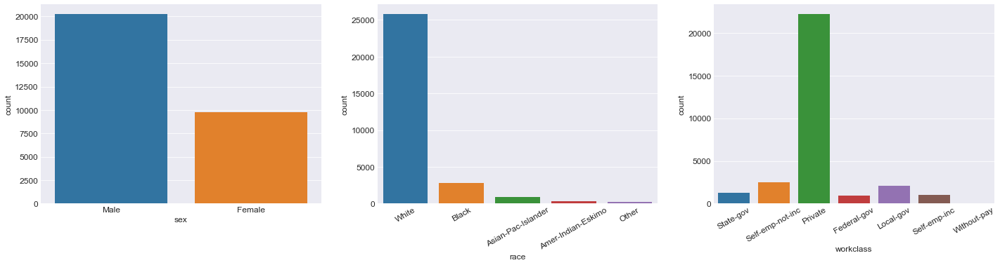

In [13]:
#some EDA visualizing data quality
plt.style.use('seaborn-darkgrid')
fig, ax = plt.subplots(figsize=(20, 5))
plt.tight_layout(pad=3)
plt.rcParams.update({'font.size': 12})

plt.subplot(1,3,1)
sns.countplot(x="sex", data=df)

plt.subplot(1,3,2)
sns.countplot(x="race", data=df)
plt.xticks(rotation=30)

plt.subplot(1,3,3)
sns.countplot(x="workclass", data=df)
plt.xticks(rotation=30)

<AxesSubplot:xlabel='capital-loss', ylabel='Density'>

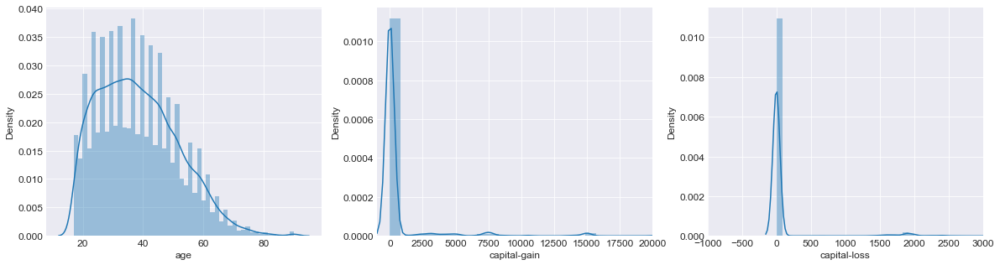

In [14]:
#some EDA visualizing data quality


plt.style.use('seaborn-darkgrid')
fig, ax = plt.subplots(figsize=(20, 5))

plt.subplot(1,3,1)
sns.distplot(df['age'])

plt.subplot(1,3,2)
plt.xlim(-1000,20000)
sns.distplot(df['capital-gain'])

plt.subplot(1,3,3)
plt.xlim(-1000,3000)
sns.distplot(df['capital-loss'])


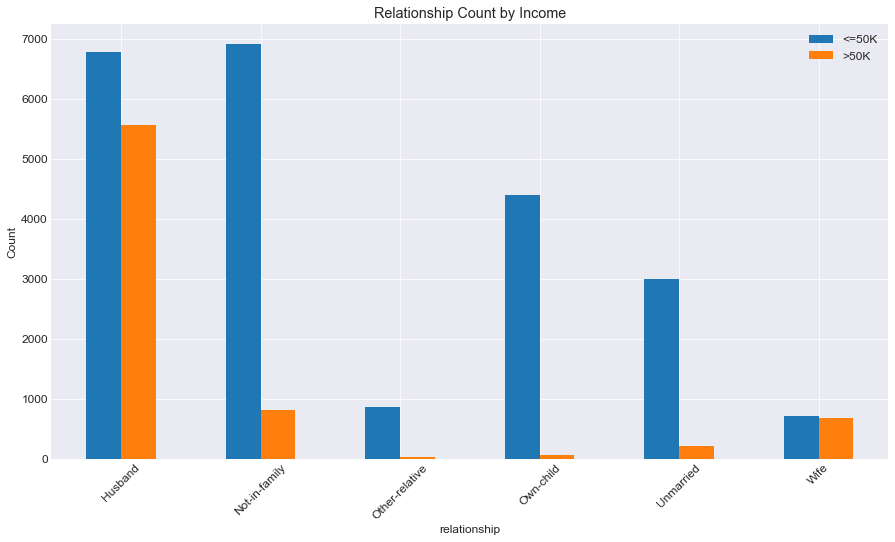

In [15]:

df.groupby('relationship')['income'].value_counts().unstack().plot.bar(figsize=(15,8))
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.title('Relationship Count by Income')
plt.legend(['<=50K','>50K'])

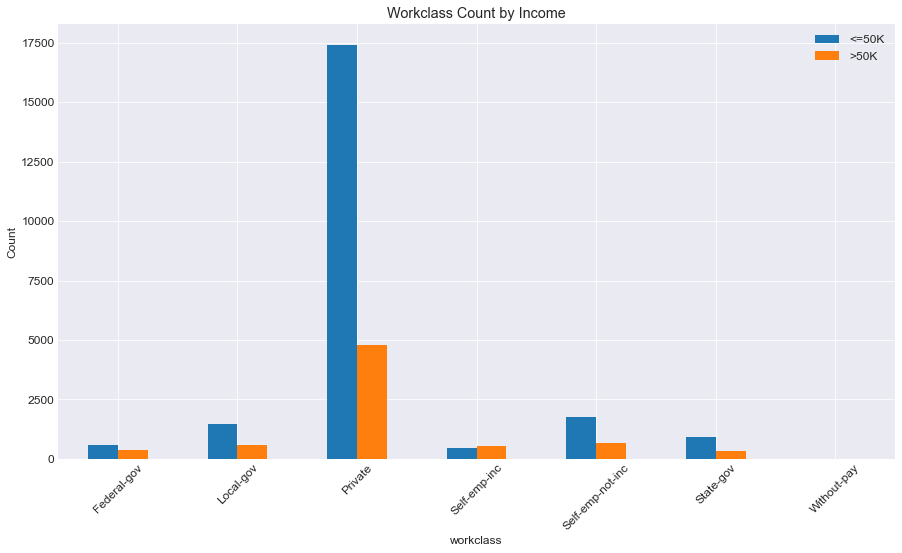

In [16]:
df.groupby('workclass')['income'].value_counts().unstack().plot.bar(figsize=(15,8))
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.title('Workclass Count by Income')
plt.legend(['<=50K','>50K'])

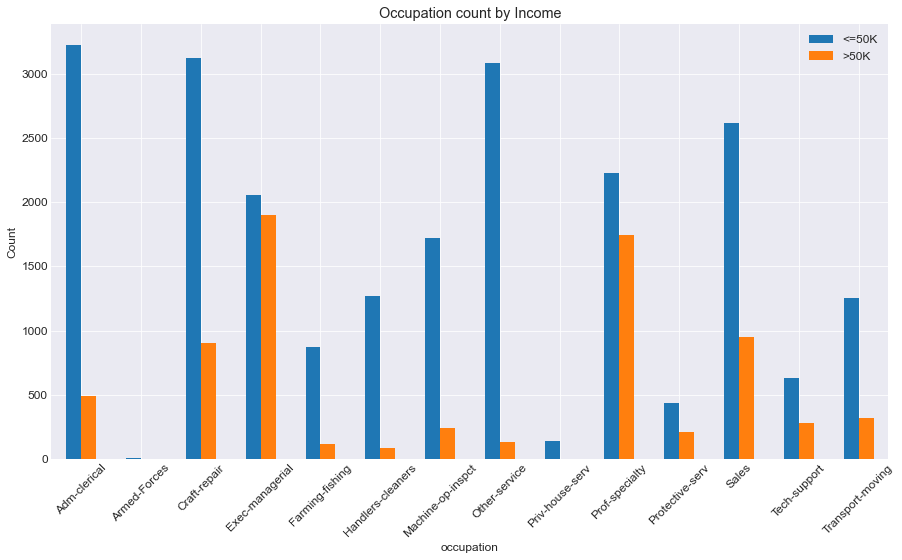

In [17]:
df.groupby('occupation')['income'].value_counts().unstack().plot.bar(figsize=(15,8))
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.title('Occupation count by Income')
plt.legend(['<=50K','>50K'])

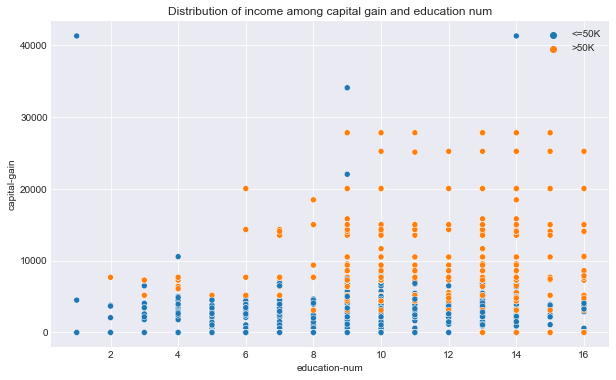

In [25]:
plt.rcParams.update({'font.size': 10})
plt.figure(figsize= (10,6))
sns.scatterplot(data=df,x='education-num', y='capital-gain',hue = 'income')
plt.title('Distribution of income among capital gain and education num')
plt.legend(loc = 'upper right')

Text(0.5, 1.0, 'Distribution of income among occupation and working hours')

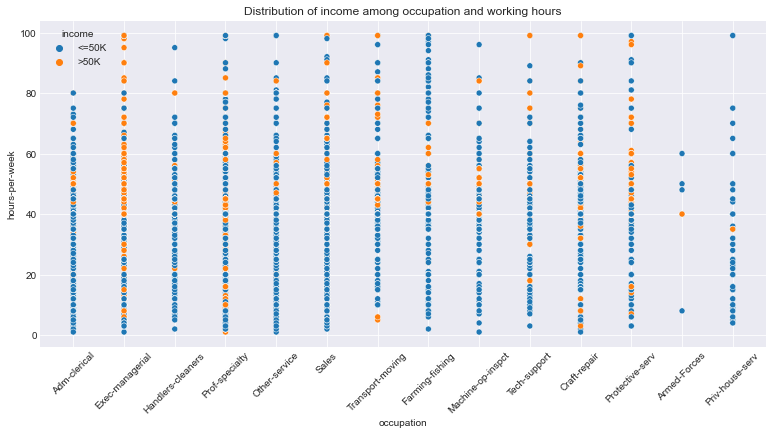

In [26]:

plt.figure(figsize= (13,6))
sns.scatterplot(data=df,x='occupation', y='hours-per-week',hue = 'income')
plt.xticks(rotation=45)
plt.title('Distribution of income among occupation and working hours')

<h2>Prepare for building models

In [34]:
cat = df[['workclass','marital-status','occupation','relationship','sex','race','native-country']]
num = df[['age','education-num','capital-gain','capital-loss','hours-per-week']]
other = df[['fnlwgt','income']]


<AxesSubplot:>

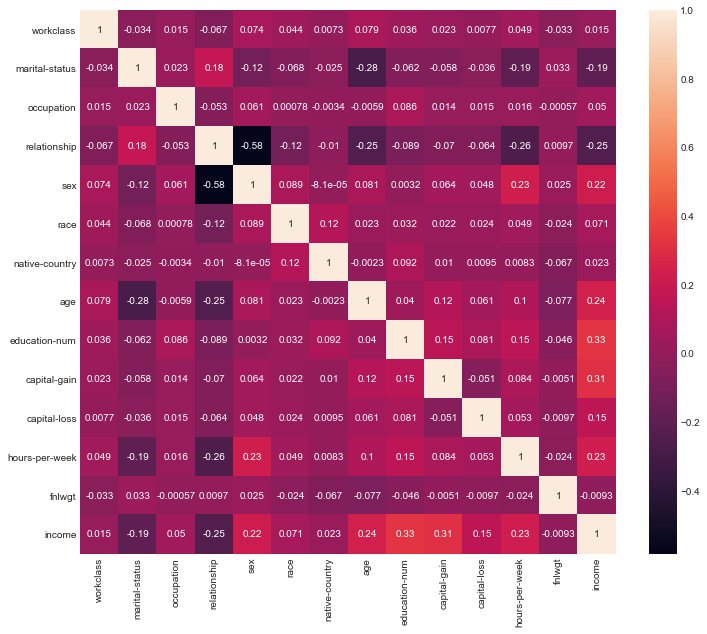

In [74]:
#Checking the correlation with label Encode
from sklearn.preprocessing import LabelEncoder
catlb = cat.apply(LabelEncoder().fit_transform)
df1 = pd.concat([catlb,num,other],axis=1)
plt.figure(figsize=(12,10))
sns.heatmap(df1.corr(),annot=True)


In [35]:
#one hot encoding for categorical fields needed
cat_dum = pd.get_dummies(cat.drop(columns=['race','native-country']),drop_first = True)

<h1>Start building the model with cleansed dataset</h1>

In [36]:
df = pd.concat([cat_dum,num,other],axis=1)

In [37]:
#droping weak correlation field to avoid too many noise to the model
X = df.drop(columns=['fnlwgt','income'])
y = df['income']


In [38]:
from sklearn.model_selection import train_test_split,cross_val_score
Xtrain,Xtest,ytrain,ytest = train_test_split(X,y,test_size = 0.2, random_state = 20)

In [39]:
#standard scaler for num
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
Xtrain = scaler.fit_transform(Xtrain)
Xtest = scaler.transform(Xtest)

In [96]:
from sklearn.decomposition import PCA
pca = PCA()
Xtrain_pca = pca.fit_transform(Xtrain)
Xtest_pca = pca.transform(Xtest)
explained_variance = pca.explained_variance_ratio_ 
print(sorted(explained_variance))


[0.00026468661794820756, 0.0019753460056181294, 0.003467393527190809, 0.00565972935331343, 0.009951892491651598, 0.012128666878803667, 0.01385867224997144, 0.0185045956328554, 0.01944665777476495, 0.021824866137424754, 0.02314508118420588, 0.024154962099811248, 0.02521317852114638, 0.026328136402280895, 0.027039306200075268, 0.027361862087904004, 0.027684032907483863, 0.027700590577710037, 0.02788501218455626, 0.028273468762896267, 0.028943266595004086, 0.028991535202769127, 0.02930215535394261, 0.029523832041063087, 0.029879096455485275, 0.03044205256908113, 0.031173772184139154, 0.03191543541853453, 0.03242295516649669, 0.03415226590749602, 0.03752758395608423, 0.041767214582145405, 0.044297545782080866, 0.050897311125754054, 0.05817657412729516, 0.08871926593501617]


<AxesSubplot:title={'center':'PCA Component Explained Variances'}, xlabel='First n principal components', ylabel='Explained variance ratio of first n components'>

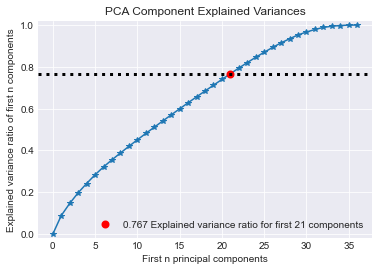

In [95]:
import scikitplot as skplt
skplt.decomposition.plot_pca_component_variance(pca)

<h2>Using GridSearchCV for hyperparameters tuning

In [101]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
knn = KNeighborsClassifier()
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold



#gridsearch for adaboost

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

param_grid = {"base_estimator__criterion" : ["gini", "entropy"],
              "base_estimator__splitter" :   ["best", "random"],
              "base_estimator__max_depth" :  [2,3,4,5,6,7,8,9],
              "n_estimators": [30,50,100,50,200],
              "learning_rate":[0.01,0.05,0.1,0.3]
             }
DTC = DecisionTreeClassifier()
ABC = AdaBoostClassifier(base_estimator = DTC)
grid_search0 = GridSearchCV(ABC, param_grid=param_grid, scoring = 'accuracy',cv=10)
grid_search0.fit(Xtrain,ytrain)
print(grid_search0.best_params_)
print(grid_search0.best_score_)

# grid search agin for xgbm
# {'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 150}
# -0.28811573741857754
modelxgb = XGBClassifier()
learning_rate_41 =[0.0001,0.001,0.01,0.2,0.3]
n_estimators_23=[50, 100, 150, 200]
max_depth_28 =[2,4,6,8]
param_grid = {"learning_rate": learning_rate_41, "n_estimators" : n_estimators_23, "max_depth" : max_depth_28} 
grid_search1 = GridSearchCV(modelxgb,param_grid, scoring="neg_log_loss", n_jobs=1, cv=10) 
grid_search1.fit(Xtrain,ytrain)
print(grid_search1.best_params_)
print(grid_search1.best_score_)


# Grid search for LGBM
from lightgbm import LGBMClassifier 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

lgbm = LGBMClassifier()
class_weight = [None,'balanced']
boosting_type = ['gbdt', 'goss', 'dart']
num_leaves = [30,50,100,150] #list(range(30, 150)),
learning_rate = list(np.logspace(np.log(0.005), np.log(0.2), base = np.exp(1), num = 10)) #1000
lgg_grid = dict(class_weight=class_weight, boosting_type=boosting_type, num_leaves=num_leaves, learning_rate =learning_rate)

grid_search2 = GridSearchCV(estimator=lgbm, 
                param_grid=lgg_grid, n_jobs=-1, cv=10,  
                scoring='accuracy',error_score=0)

grid_search2.fit(Xtrain,ytrain) 
print(grid_search2.best_params_)
print(grid_search2.best_score_)

# Grid search for Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

lr = LogisticRegression()

solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
lr_grid = dict(solver=solvers,penalty=penalty,C=c_values)

grid_search3 = GridSearchCV(estimator=lr, 
                param_grid=lr_grid, n_jobs=-1, cv=10,  
                scoring='accuracy',error_score=0)
grid_search3.fit(Xtrain,ytrain) 
print(grid_search3.best_params_)
print(grid_search3.best_score_)



#Grid Search for Random Forest
#Random Forest
rdf = RandomForestClassifier()
n_estimators = [10, 100, 1000,10000]
max_features = ['sqrt', 'log2']
rf_grid = dict(n_estimators=n_estimators,max_features=max_features)

grid_search4 = GridSearchCV(estimator=rdf, 
                param_grid=rf_grid, n_jobs=-1, cv=10,  
                scoring='accuracy',error_score=0)
grid_search4.fit(Xtrain,ytrain) 
print(grid_search4.best_params_)
print(grid_search4.best_score_)
#best params
#n_estimators=1000
#max_features=sqrt


#K-Nearest - Neighborg
n_neighbors = range(1, 10, 2)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
kparams = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
grid_search5 = GridSearchCV(estimator=knn,param_grid=kparams,cv=5,scoring='accuracy')
grid_search5.fit(Xtrain,ytrain)
print(grid_search5.best_params_)
print(grid_search5.best_score_)



{'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'uniform'}
0.8349505025276182
{'boosting_type': 'dart', 'class_weight': None, 'learning_rate': 0.1327465766240114, 'num_leaves': 30}
0.8656868269916677
{'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.8450295654634605


<h2> Cross Validaton check on 6 models

In [135]:
#Spot Check 6 Algorithms 
models = []
models.append(('XGB', XGBClassifier(max_depth=4, n_estimators=150,learning_rate=0.2)))
models.append(('ADA', AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=4), n_estimators=400,learning_rate=0.03)))
models.append(("LGBM",LGBMClassifier(boosting_type='dart',class_weight=None,learning_rate=0.1327,num_leaves=30)))
models.append(('Random Forest', RandomForestClassifier(n_estimators=500, max_leaf_nodes=20, n_jobs=-1, max_features='log2')))
models.append(('LR', LogisticRegression(random_state=42,C=1.0, penalty='l2', solver='liblinear')))
models.append(('KNN', KNeighborsClassifier(metric='euclidean', n_neighbors=9, weights='uniform')))


# evalutate each model in turn
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=10, random_state=20)
    cv_results = cross_val_score(model, Xtrain, ytrain, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
import matplotlib.pyplot as plt
newl = []
for i,v in enumerate(results):
    for x in v:
        newl.append([names[i],x])
numpd = pd.DataFrame(newl)
d = {0:'Model',1:'Accuracy'}
numpd.rename(columns = d, inplace=True)


XGB: 0.866270 (0.003328)
ADA: 0.866353 (0.002942)
LGBM: 0.865270 (0.003293)
Random Forest: 0.848153 (0.005708)
LR: 0.844738 (0.004868)
KNN: 0.834701 (0.005283)


In [136]:
#get mean accuracy scores
numpd.groupby('Model').mean().sort_values(by='Accuracy',ascending=False)

,Accuracy
Model,
ADA,0.866353
XGB,0.866270
LGBM,0.865270
Random Forest,0.848153
LR,0.844738
KNN,0.834701


Text(0.5, 1.0, '10-Fold Cross Validation Score')

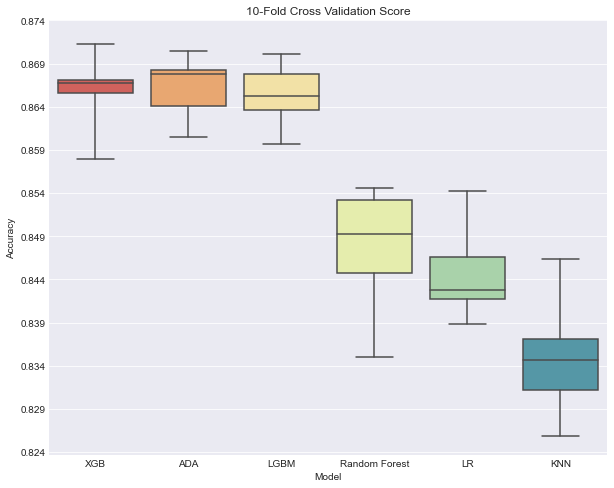

In [137]:
#boxplot to show the 10 fold results
plt.figure(figsize = (10,8))
ax = sns.boxplot(x='Model',y='Accuracy',whis = (0, 100),data=numpd,palette='Spectral')
start, end = ax.get_ylim()
ax.yaxis.set_ticks(np.arange(round(start,3), round(end,3), 0.005))
plt.title('10-Fold Cross Validation Score')

<h1>Further evaluate different metrics using ROC curves, Precision-Recall Curve and review accuracy, F1, precision & recall

In [40]:
# Instantiate the classfiers and make a list
classifiers = [XGBClassifier(max_depth=4, n_estimators=150,learning_rate=0.2),
            AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=4), n_estimators=400,learning_rate=0.03),
    LGBMClassifier(boosting_type='dart',class_weight=None,learning_rate=0.1327,num_leaves=30),
    RandomForestClassifier(n_estimators=500, max_leaf_nodes=20, n_jobs=-1, max_features='log2'),
               LogisticRegression(random_state=42,C=1.0, penalty='l2', solver='liblinear'), 
               KNeighborsClassifier(metric='euclidean', n_neighbors=9, weights='uniform')
               ]

In [43]:
#Plot ROC
plt.style.use('seaborn-darkgrid')
# Define a result table as a DataFrame
result_table = pd.DataFrame(columns=['classifiers', 'thresholds','fpr','tpr','auc'])

# Train the models and record the results
for cls in classifiers:
    
    model = cls.fit(Xtrain, ytrain)
    yproba = model.predict_proba(Xtest)[:,1]
    fpr, tpr, thresholds = roc_curve(ytest,  yproba)
    auc = roc_auc_score(ytest, yproba)
    
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx] 
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'thresholds':optimal_threshold, 
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)

# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

In [44]:
result_table['thresholds']

classifiers
XGBClassifier             0.278573
AdaBoostClassifier        0.478662
LGBMClassifier            0.286157
RandomForestClassifier    0.308646
LogisticRegression        0.238747
KNeighborsClassifier      0.333333
Name: thresholds, dtype: float64

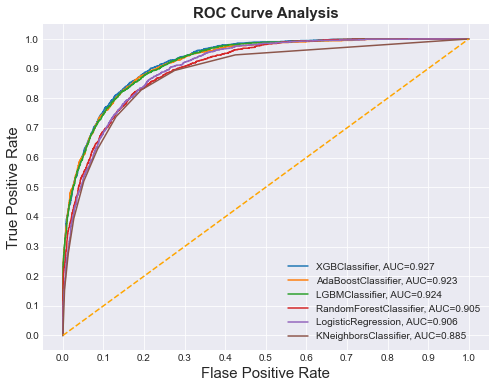

In [296]:
fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("Flase Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':10}, loc='lower right')
plt.show()

In [45]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score,auc,accuracy_score,precision_score,recall_score

# Define a result table as a DataFrame
result_table1 = pd.DataFrame(columns=['classifiers', 'precision','recall','precs','recalls','f1','accu','auc'])

# Train the models and record the results
for cls in classifiers:
    model = cls.fit(Xtrain, ytrain)

    yproba = model.predict_proba(Xtest)[:, 1]
    yhat = model.predict(Xtest)

    precision, recall, _ = precision_recall_curve(ytest, yproba)
    f1, aucr = f1_score(ytest, yhat), auc(recall, precision)
    precs=precision_score(ytest, yhat)
    recalls=recall_score(ytest, yhat)
    accu=accuracy_score(ytest, yhat)

    result_table1 = result_table1.append({'classifiers':cls.__class__.__name__,
                                        'precision':precision, 
                                        'recall':recall, 
                                        'precs':precs,
                                        'recalls':recalls,
                                        'f1':f1,
                                        'accu':accu,
                                        'auc':aucr}, ignore_index=True)
result_table1.set_index('classifiers', inplace=True)



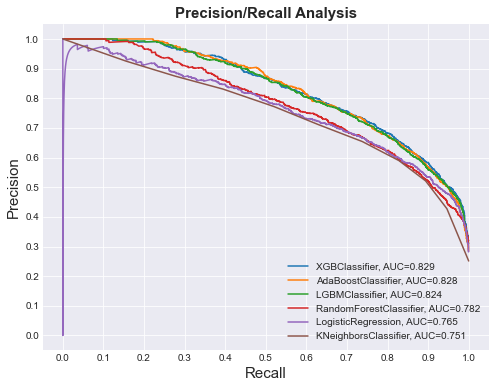

In [301]:
#plot precision and recall
fig = plt.figure(figsize=(8,6))

for i in result_table1.index:
    plt.plot(result_table1.loc[i]['recall'], 
             result_table1.loc[i]['precision'], 
             label="{}, AUC={:.3f}".format(i, result_table1.loc[i]['auc']))
    

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("Recall", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("Precision", fontsize=15)

plt.title('Precision/Recall Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':10}, loc='lower right')


In [46]:
comparedf = result_table1[['accu','f1','precs','recalls']]
comparedf.columns=['Accuracy','F1-score','Precision','Recall']
comparedf['Components']='All components'

/Users/mankan/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5, 1.0, 'Accuracy & F1-Score Comparison ')

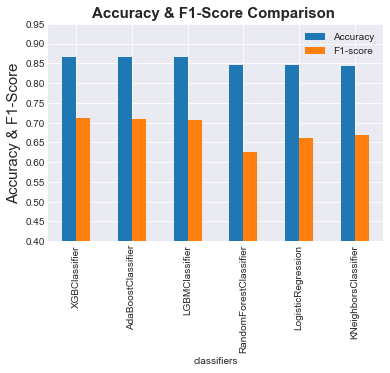

In [299]:
comparedf[['Accuracy','F1-score']].plot.bar()

plt.ylim(bottom=0.5)
plt.yticks(np.arange(0.4, 1, step=0.05))
plt.ylabel("Accuracy & F1-Score", fontsize=15)

plt.title('Accuracy & F1-Score Comparison ', fontweight='bold', fontsize=15)


Text(0.5, 1.0, 'Precision & Recall Comparison')

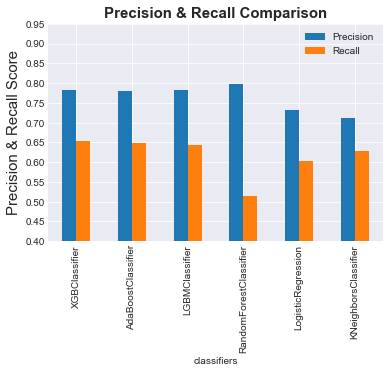

In [300]:
comparedf[['Precision','Recall']].plot.bar()
plt.ylim(bottom=0.5)
plt.yticks(np.arange(0.4, 1, step=0.05))
plt.ylabel("Precision & Recall Score", fontsize=15)
plt.title('Precision & Recall Comparison', fontweight='bold', fontsize=15)


In [276]:
result_table1

,precision,recall,f1,auc
classifiers,,,,
XGBClassifier,"[0.31073562744694005, 0.31059356966199503, 0.3...","[1.0, 0.9993368700265252, 0.9993368700265252, ...",0.716732,0.815172
LGBMClassifier,"[0.29230471021515797, 0.2921675067855758, 0.29...","[1.0, 0.9993368700265252, 0.9993368700265252, ...",0.709427,0.806420
AdaBoostClassifier,"[0.27956989247311825, 0.2794363063230113, 0.27...","[1.0, 0.9993368700265252, 0.9993368700265252, ...",0.716102,0.817419
RandomForestClassifier,"[0.25120772946859904, 0.3088144647626875, 0.30...","[1.0, 0.996684350132626, 0.996684350132626, 0....",0.662384,0.723734
KNeighborsClassifier,"[0.25120772946859904, 0.4931766489764973, 0.58...","[1.0, 0.8627320954907162, 0.73342175066313, 0....",0.648110,0.694292
LogisticRegression,"[0.2836719337848006, 0.28353715898400755, 0.28...","[1.0, 0.9993368700265252, 0.9993368700265252, ...",0.689931,0.760253
GaussianNB,"[0.252977688307331, 0.25285234899328857, 0.252...","[1.0, 0.9993368700265252, 0.9993368700265252, ...",0.630042,0.732523


<h1>Evalute the model preformance with top 13 strong coefficient from boosting models

In [384]:
newdf = df[['age','capital-gain','capital-loss','education-num','hours-per-week','marital-status_Married-civ-spouse','marital-status_Never-married','occupation_Exec-managerial','occupation_Other-service','occupation_Prof-specialty','relationship_Wife','sex_Male','workclass_Self-emp-not-inc','income']]

In [385]:
newX = newdf.drop(columns=['income'])
newy = newdf['income']

In [386]:
from sklearn.model_selection import train_test_split,cross_val_score
newXtrain,newXtest,newytrain,newytest = train_test_split(newX,newy,test_size = 0.2, random_state = 20)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
newXtrain = scaler.fit_transform(newXtrain)
newXtest = scaler.transform(newXtest)

<h2>GridSearch again for 3 boosting models

In [147]:
#gridsearch for lgbm
{'boosting_type': 'gbdt', 'class_weight': None, 'learning_rate': 0.05848035476425732, 'num_leaves': 50}
# 0.864770732844107
lgbm = LGBMClassifier()
#LGB
class_weight = [None,'balanced']
boosting_type = ['gbdt', 'goss', 'dart']
num_leaves = [30,50,100,150] #list(range(30, 150)),
learning_rate = list(np.logspace(np.log(0.005), np.log(0.2), base = np.exp(1), num = 10)) #1000
lgg_grid = dict(class_weight=class_weight, boosting_type=boosting_type, num_leaves=num_leaves, learning_rate =learning_rate)

grid_search1 = GridSearchCV(estimator=lgbm, 
                param_grid=lgg_grid, n_jobs=-1, cv=10,  
                scoring='accuracy',error_score=0)

grid_search1.fit(newXtrain,newytrain) 
print(grid_search1.best_params_)
print(grid_search1.best_score_)

#gridsearch for adaboost

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

param_grid = {"base_estimator__criterion" : ["gini", "entropy"],
              "base_estimator__splitter" :   ["best", "random"],
              "base_estimator__max_depth" :  [2,3,4,5,6,7,8,9],
              "n_estimators": [30,50,100,50,200],
              "learning_rate":[0.01,0.05,0.1,0.3]
             }
DTC = DecisionTreeClassifier()
ABC = AdaBoostClassifier(base_estimator = DTC)
# run grid search
grid_search_2 = GridSearchCV(ABC, param_grid=param_grid, scoring = 'accuracy',cv=10)
grid_search_2.fit(newXtrain,newytrain)
print(grid_search_2.best_params_)
print(grid_search_2.best_score_)

# grid search agin for xgbm
# {'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 150}
# -0.28811573741857754
modelxgb = XGBClassifier()
learning_rate_41 =[0.0001,0.001,0.01,0.2,0.3]
n_estimators_23=[50, 100, 150, 200]
max_depth_28 =[2,4,6,8]
param_grid = {"learning_rate": learning_rate_41, "n_estimators" : n_estimators_23, "max_depth" : max_depth_28} 
grid_search3 = GridSearchCV(modelxgb,param_grid, scoring="neg_log_loss", n_jobs=1, cv=10) 
grid_search3.fit(newXtrain,newytrain)
print(grid_search3.best_params_)
print(grid_search3.best_score_)


{'base_estimator__criterion': 'entropy', 'base_estimator__splitter': 'best', 'learning_rate': 0.1, 'n_estimators': 100}
0.8648539100936642


In [340]:
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier 
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import classification_report
from scipy import stats
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.decomposition import PCA

# Instantiate the classfiers and make a list
classifiers = [XGBClassifier(max_depth=4, n_estimators=150,learning_rate=0.2),
            AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=4,criterion='entropy',splitter='best'), n_estimators=100,learning_rate=0.1),
    LGBMClassifier(boosting_type='gbdt',class_weight=None,learning_rate=0.058,num_leaves=50)
               ]



In [341]:
result_table3 = pd.DataFrame(columns=['classifiers','fpr','tpr','auc'])

# Train the models and record the results
for cls in classifiers:
    
    model = cls.fit(newXtrain, newytrain)
    newyproba = model.predict_proba(newXtest)[:,1]
    fpr, tpr, _ = roc_curve(newytest, newyproba)
    auc = roc_auc_score(newytest, newyproba)
    

    result_table3 = result_table3.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)

# Set name of the classifiers as index labels
result_table3.set_index('classifiers', inplace=True)



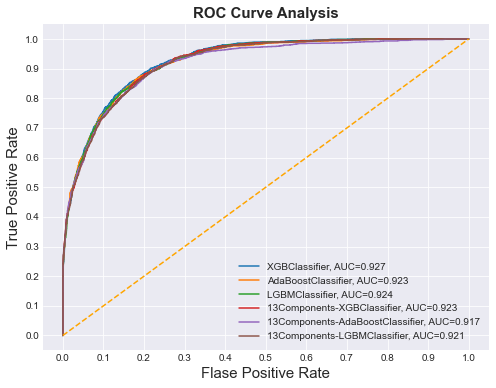

In [342]:
fig = plt.figure(figsize=(8,6))

for i in result_table.index[0:3] :
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))

for i in result_table3.index:
    plt.plot(result_table3.loc[i]['fpr'], 
             result_table3.loc[i]['tpr'], 
             label="13Components-{}, AUC={:.3f}".format(i, result_table3.loc[i]['auc']))
    

plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("Flase Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':10}, loc='lower right')
plt.show()

In [314]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score,auc,accuracy_score,precision_score,recall_score

# Define a result table as a DataFrame
result_table2 = pd.DataFrame(columns=['classifiers', 'precision','recall','precs','recalls','f1','accu','auc'])

# Train the models and record the results
for cls in classifiers:
    model = cls.fit(newXtrain, newytrain)
    newyproba = model.predict_proba(newXtest)[:, 1]
    newyhat = model.predict(newXtest)
    precision, recall, _ = precision_recall_curve(newytest, newyproba)
    f1, aucr = f1_score(newytest, newyhat), auc(recall, precision)
    precs=precision_score(newytest, newyhat)
    recalls=recall_score(newytest, newyhat)
    accu=accuracy_score(newytest, newyhat)

    result_table4 = result_table4.append({'classifiers':cls.__class__.__name__,
                                        'precision':precision, 
                                        'recall':recall, 
                                        'precs':precs,
                                        'recalls':recalls,
                                        'f1':f1,
                                        'accu':accu,
                                        'auc':aucr}, ignore_index=True)
result_table4.set_index('classifiers', inplace=True)


In [315]:
comparedf2 = result_table4[['accu','f1','precs','recalls']]
comparedf2.columns=['Accuracy','F1-score','Precision','Recall']
comparedf2['Components']='13features'
comparedf2

,Accuracy,F1-score,Precision,Recall,Components
classifiers,,,,,
XGBClassifier,0.862069,0.699782,0.772000,0.639920,13features
AdaBoostClassifier,0.862569,0.696580,0.781998,0.627984,13features
LGBMClassifier,0.861902,0.698436,0.773570,0.636605,13features


In [302]:
comparedf

,Accuracy,F1-score,Precision,Recall,Components
classifiers,,,,,
XGBClassifier,0.866900,0.711240,0.781573,0.652520,All components
AdaBoostClassifier,0.865567,0.708137,0.778839,0.649204,All components
LGBMClassifier,0.865067,0.705240,0.781452,0.642573,All components
RandomForestClassifier,0.845411,0.626108,0.797741,0.515252,All components
LogisticRegression,0.844578,0.661097,0.730924,0.603448,All components
KNeighborsClassifier,0.842745,0.667606,0.711712,0.628647,All components


In [ ]:
comparedf_boosting =comparedf.drop(['RandomForestClassifier', 'LogisticRegression','KNeighborsClassifier'])

In [316]:
featuredf = pd.concat([comparedf_boosting,comparedf2],axis=0)

In [317]:
featuredf

,Accuracy,F1-score,Precision,Recall,Components
classifiers,,,,,
XGBClassifier,0.866900,0.711240,0.781573,0.652520,All components
AdaBoostClassifier,0.865567,0.708137,0.778839,0.649204,All components
LGBMClassifier,0.865067,0.705240,0.781452,0.642573,All components
XGBClassifier,0.862069,0.699782,0.772000,0.639920,13features
AdaBoostClassifier,0.862569,0.696580,0.781998,0.627984,13features
LGBMClassifier,0.861902,0.698436,0.773570,0.636605,13features


<h2>We can see that the boosting model preformance is not getting better with just 13 components. Only precision for Adaboost is very slightly improved.

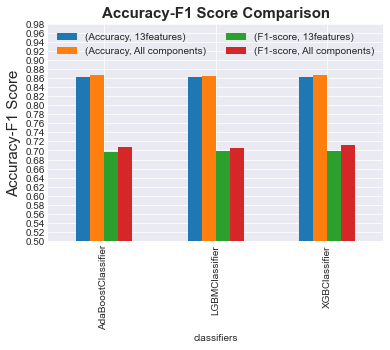

In [321]:
featuredf.groupby(['classifiers','Components'])[['Accuracy','F1-score']].sum().unstack().plot(kind='bar')
plt.ylim(bottom=0.5)
plt.yticks(np.arange(0.5, 1, step=0.02))
plt.ylabel("Accuracy-F1 Score", fontsize=15)
plt.title('Accuracy-F1 Score Comparison', fontweight='bold', fontsize=15)
plt.legend(loc="upper left", mode = "expand", ncol = 2)


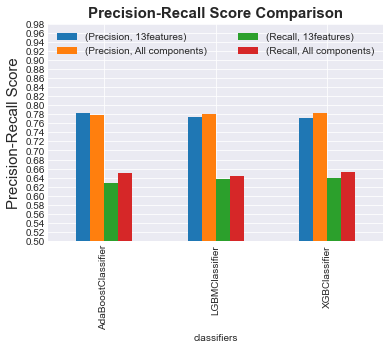

In [320]:
featuredf.groupby(['classifiers','Components'])[['Precision','Recall']].sum().unstack().plot(kind='bar')
plt.ylim(bottom=0.5)
plt.yticks(np.arange(0.5, 1, step=0.02))
plt.ylabel("Precision-Recall Score", fontsize=15)
plt.title('Precision-Recall Score Comparison', fontweight='bold', fontsize=15)
plt.legend(loc="upper left", mode = "expand", ncol = 2)

<h2>Evaluating model after over-sampling

In [47]:
#test on SMOTE
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
SMOTEXtrain,SMOTEytrain = oversample.fit_resample(Xtrain,ytrain)


In [ ]:
# #gridsearch for lgbm

#       {'boosting_type': 'gbdt', 'class_weight': None, 'learning_rate': 0.08810826802697265, 'num_leaves': 150}",
#       "0.897546154807416"
# lgbm = LGBMClassifier()
# #LGB
# class_weight = [None,'balanced']
# boosting_type = ['gbdt', 'goss', 'dart']
# num_leaves = [30,50,100,150] #list(range(30, 150)),
# learning_rate = list(np.logspace(np.log(0.005), np.log(0.2), base = np.exp(1), num = 10)) #1000
# lgg_grid = dict(class_weight=class_weight, boosting_type=boosting_type, num_leaves=num_leaves, learning_rate =learning_rate)

# grid_search1 = GridSearchCV(estimator=lgbm, 
#                 param_grid=lgg_grid, n_jobs=-1, cv=10,  
#                 scoring='accuracy',error_score=0)

# grid_search1.fit(SMOTEXtrain,SMOTEytrain) 
# print(grid_search1.best_params_)
# print(grid_search1.best_score_)

# #gridsearch for adaboost

# from sklearn.tree import DecisionTreeClassifier
# from sklearn.ensemble import AdaBoostClassifier

# param_grid = {"base_estimator__criterion" : ["gini", "entropy"],
#               "base_estimator__splitter" :   ["best", "random"],
#               "base_estimator__max_depth" :  [2,3,4,5,6,7,8,9],
#               "n_estimators": [30,50,100,50,200],
#               "learning_rate":[0.01,0.05,0.1,0.3]
#              }
# DTC = DecisionTreeClassifier()
# ABC = AdaBoostClassifier(base_estimator = DTC)
# # run grid search
# grid_search2 = GridSearchCV(ABC, param_grid=param_grid, scoring = 'accuracy',cv=10)
# grid_search2.fit(SMOTEXtrain,SMOTEytrain)
# print(grid_search2.best_params_)
# print(grid_search2.best_score_)

# grid search agin for xgbm


modelxgb = XGBClassifier()
learning_rate_41 =[0.0001,0.001,0.01,0.2,0.3]
n_estimators_23=[50, 100, 150, 200]
max_depth_28 =[2,4,6,8]
param_grid = {"learning_rate": learning_rate_41, "n_estimators" : n_estimators_23, "max_depth" : max_depth_28} 
grid_search3 = GridSearchCV(modelxgb,param_grid, scoring="neg_log_loss", n_jobs=1, cv=10) 
grid_search3.fit(SMOTEXtrain,SMOTEytrain)
print(grid_search3.best_params_)
print(grid_search3.best_score_)


In [ ]:
# Instantiate the classfiers and make a list
classifiers = [XGBClassifier(max_depth=4, n_estimators=150,learning_rate=0.2),
            AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=4,criterion='entropy',splitter='best'), n_estimators=100,learning_rate=0.1),
    LGBMClassifier(boosting_type='gbdt',class_weight=None,learning_rate=0.088,num_leaves=150)
               ]
rom sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score,auc,accuracy_score,precision_score,recall_score

# Define a result table as a DataFrame
s_result_table = pd.DataFrame(columns=['classifiers', 'precision','recall','precs','recalls','f1','accu','auc'])

# Train the models and record the results
for cls in classifiers:
    model = cls.fit(SMOTEXtrain, SMOTEytrain)
    syproba = model.predict_proba(Xtest)[:, 1]
    syhat = model.predict(Xtest)
    precision, recall, _ = precision_recall_curve(ytest, syproba)
    f1, aucr = f1_score(ytest, syhat), auc(recall, precision)
    precs=precision_score(ytest, syhat)
    recalls=recall_score(ytest, syhat)
    accu=accuracy_score(ytest, syhat)

    s_result_table = s_result_table.append({'classifiers':cls.__class__.__name__,
                                        'precision':precision, 
                                        'recall':recall, 
                                        'precs':precs,
                                        'recalls':recalls,
                                        'f1':f1,
                                        'accu':accu,
                                        'auc':aucr}, ignore_index=True)
s_result_table.set_index('classifiers', inplace=True)

In [ ]:
s_comparedf = s_result_table[['accu','f1','precs','recalls']]
s_comparedf.columns=['Accuracy','F1-score','Precision','Recall']
s_comparedf['Components']='SMOTE'

smotedf = pd.concat([s_comparedf,comparedf_boosting],axis=0)
smotedf

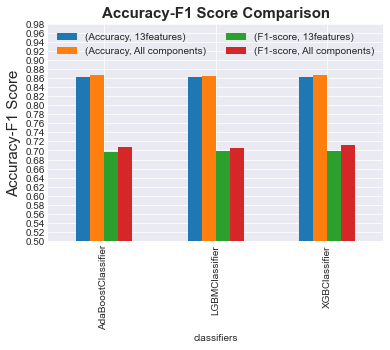

In [321]:
smotedf.groupby(['classifiers','Components'])[['Accuracy','F1-score']].sum().unstack().plot(kind='bar')
plt.ylim(bottom=0.5)
plt.yticks(np.arange(0.5, 1, step=0.02))
plt.ylabel("Accuracy-F1 Score", fontsize=15)
plt.title('Accuracy-F1 Score Comparison', fontweight='bold', fontsize=15)
plt.legend(loc="upper left", mode = "expand", ncol = 2)


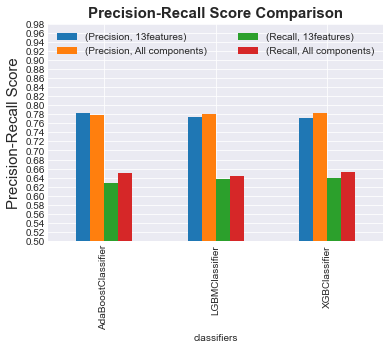

In [320]:
smotedf.groupby(['classifiers','Components'])[['Precision','Recall']].sum().unstack().plot(kind='bar')
plt.ylim(bottom=0.5)
plt.yticks(np.arange(0.5, 1, step=0.02))
plt.ylabel("Precision-Recall Score", fontsize=15)
plt.title('Precision-Recall Score Comparison', fontweight='bold', fontsize=15)
plt.legend(loc="upper left", mode = "expand", ncol = 2)

Predict Donald Trump


In [270]:
dt=pd.DataFrame(data = {

'workclass_Private':0,
'workclass_Self-emp-inc':0,
'workclass_Self-emp-not-inc':0, 
'workclass_State-gov':0,
'workclass_Without-pay':0, 
'marital-status_Married-AF-spouse':0,
'marital-status_Married-civ-spouse':1,
'marital-status_Married-spouse-absent':0, 
'marital-status_Never-married':0,
'marital-status_Separated':0, 
'marital-status_Widowed':0,
'occupation_Armed-Forces':0, 
'occupation_Craft-repair':0,
'occupation_Exec-managerial':1, 
'occupation_Farming-fishing':0,
'occupation_Handlers-cleaners':0, 
'occupation_Machine-op-inspct':0,
'occupation_Other-service':0, 
'occupation_Priv-house-serv':0,
'occupation_Prof-specialty':0,
'occupation_Protective-serv':0,
'occupation_Sales':0, 
'occupation_Tech-support':0,
'occupation_Transport-moving':0, 
'relationship_Not-in-family':0,
'relationship_Other-relative':0, 
'relationship_Own-child':0,
'relationship_Unmarried':0, 
'relationship_Wife':0, 
'sex_Male':1,
'age':74,
'education-num':13, 
'capital-gain':434900000, 
'capital-loss':47400000, 
'hours-per-week':42
}
,index=[0])



dtXtest = dt.to_numpy()
# loss US47.4 million
# gain $US434.9 million
#$18.1 million
# https://www.forbes.com/sites/danalexander/2020/09/28/yes-donald-trump-is-still-a-billionaire-that-makes-his-750-tax-payment-even-more-scandalous/#a7def7628850

In [281]:
dtXtest = scaler.transform(dtXtest)

In [291]:
classifiers = [XGBClassifier(max_depth=4, n_estimators=150,learning_rate=0.2),
            AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=4), n_estimators=400,learning_rate=0.03),
    LGBMClassifier(boosting_type='dart',class_weight=None,learning_rate=0.1327,num_leaves=30),
    RandomForestClassifier(n_estimators=500, max_leaf_nodes=20, n_jobs=-1, max_features='log2'),
               LogisticRegression(random_state=42,C=1.0, penalty='l2', solver='liblinear'), 
               KNeighborsClassifier(metric='euclidean', n_neighbors=9, weights='uniform')
               ]

dtresult = pd.DataFrame(columns=['classifiers', 'predict'])
for cls in classifiers:
    model = cls.fit(Xtrain, ytrain)
    ypred = model.predict(dtXtest)
    dtresult = dtresult.append({'classifiers':cls.__class__.__name__,
                                        'predict':ypred},ignore_index=True)

In [292]:
dtresult

,classifiers,predict
0,XGBClassifier,[1]
1,AdaBoostClassifier,[1]
2,LGBMClassifier,[1]
3,RandomForestClassifier,[1]
4,LogisticRegression,[1]
5,KNeighborsClassifier,[1]


<h1>Some trial on unsupervised learning - K Means

In [ ]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters = 2, random_state=20)
km.fit(df.drop('income', axis=1))
def income(x):
    if x == '<=50K':
        return 0
    if x =='>50K':
        return 1
df['income']=df['income'].apply(income)
from sklearn.metrics import classification_report, confusion_matrix
print(confusionmatrix(df['income'],km.labels))
print()
print(classificationreport(df['income'],km.labels))